# 1. Data Preprocessing

# (1) Reading the Training, the Development and the Testing Datasets 

In [1]:
import pandas as pd
from os import listdir

import matplotlib.pyplot as plt
import numpy as np

In [2]:
directory1 = 'data/train'
paths1 = listdir(directory1)
paths1.sort()
paths1

['anger-ratings-0to1.train.txt',
 'fear-ratings-0to1.train.txt',
 'joy-ratings-0to1.train.txt',
 'sadness-ratings-0to1.train.txt']

In [3]:
## Define the path of training dataset
path1 = paths1[2]

In [4]:
# If you want to restore x_train vectors, y_train_vectors, x_test_vectors, y_test_vectors: you can change the 'emotion' here 
# and then restore those vectors

emotion = path1.split("-")[0]
emotion

'joy'

In [5]:
train_clean = pd.read_csv("train_clean.csv")

test_clean = pd.read_csv("test_clean.csv")

In [6]:
train_clean

,Unnamed: 0,SentID,Tweet,Emotion,Rating
0,0,10000,how fuck who heck moved fridge i knock landlor...,anger,0.938
1,1,10001,so indian uber driver called someone n word if...,anger,0.896
2,2,10002,<user> i asked parcel delivered pick store add...,anger,0.896
3,3,10003,ef whichever butt wipe pulled fire alarm davis...,anger,0.896
4,4,10004,do join <user> put phone talk rude taking mone...,anger,0.896
...,...,...,...,...,...
3955,3955,40855,common app randomly logged i writing last part...,sadness,0.833
3956,3956,40856,i would rather laugh rarest genius beautiful a...,sadness,0.688
3957,3957,40857,if invest new film i stop asking invest new fi...,sadness,0.458
3958,3958,40858,just watched django unchained other people may...,sadness,0.333


In [7]:
train = train_clean[train_clean["Emotion"] == emotion]
train

,Unnamed: 0,SentID,Tweet,Emotion,Rating
2004,2004,30000,just got back seeing <user> burslem amazing fa...,joy,0.980
2005,2005,30001,oh dear evening absolute hilarity i think i la...,joy,0.958
2006,2006,30002,been waiting week game cheer friday,joy,0.940
2007,2007,30003,<user> thank much gloria you sweet thoughtful ...,joy,0.938
2008,2008,30004,i feel blessed work family i nanny nothing lov...,joy,0.938
...,...,...,...,...,...
3881,3881,30897,it feels good get outside minute get fresh air...,joy,0.580
3882,3882,30898,<user> ppl get triggered u smiling irrelevant,joy,0.170
3883,3883,30899,<user> <user> snap chat new would beg differ o...,joy,0.396
3884,3884,30900,<user> <user> snap chat new would beg differ,joy,0.156


In [8]:
test = test_clean[test_clean["Emotion"] == emotion]
test

,Unnamed: 0,SentID,Tweet,Emotion,Rating
1755,1755,30902,you must knowing blithe means adj happy cheerful,joy,0.583
1756,1756,30903,old saying a smile shared one gained another d...,joy,0.500
1757,1757,30904,bridget jones baby bloody hilarious 😅 bridget ...,joy,0.860
1758,1758,30905,<user> sparkling water makes life sparkly,joy,0.521
1759,1759,30906,i tired everybody telling chill everythings ok...,joy,0.042
...,...,...,...,...,...
2464,2464,31611,with tired body mind sparkling teeth i say fol...,joy,0.417
2465,2465,31612,i refuse chirp chirp girl,joy,0.146
2466,2466,31613,it hard stifle laughter i overheard comment it...,joy,0.646
2467,2467,31614,while i walking little boy red shirt <number> ...,joy,0.620


In [9]:
train_tweets = list(train['Tweet'])
train_intensities = list(train['Rating'])
train_tweets[:10]

['just got back seeing <user> burslem amazing face still hurts laughing much hilarious',
 'oh dear evening absolute hilarity i think i laughed much long time 😂',
 'been waiting week game cheer friday',
 '<user> thank much gloria you sweet thoughtful you made day joyful i love',
 'i feel blessed work family i nanny nothing love amp appreciation makes smile',
 'today i reached <number> subscribers yt good day thankful',
 '<user> good morning love happy first day fall let make awesome autumn memories anna bailey laughter smile',
 'bridget jones baby best thing i seen ages so funny i missed bridget love team mark',
 'just got back seeing <user> burslem amazing face still hurts laughing much',
 '<user> i thought holidays could get cheerful i met the nice bot']

In [10]:
train_intensities[:10]

[0.98, 0.958, 0.94, 0.938, 0.938, 0.926, 0.924, 0.922, 0.92, 0.917]

In [11]:
test_tweets = list(test['Tweet'])
test_intensities = list(test['Rating'])

In [12]:
# show the distribution of text length (from below: there is no need to truncate any of texts)
def show_text_len(train):
    train["text_len"] = train['Tweet'].map(lambda x: len(x.split()))
    return train["text_len"]

In [13]:
# show Max Text Length of All Datasets for comparsion

all_tweets_max_len = pd.DataFrame(np.array([max(show_text_len(train)), max(show_text_len(test))]))

all_tweets_max_len.index = ['train', 'test']
all_tweets_max_len.columns = ['max text length']

all_tweets_max_len

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,max text length
train,29
test,31


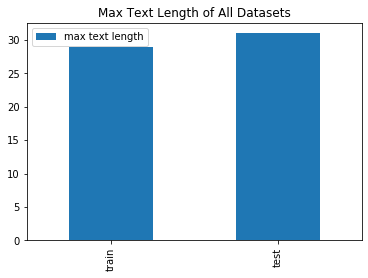

In [14]:
%matplotlib inline
import matplotlib.pyplot as plt
all_tweets_max_len.plot(kind='bar')
plt.title('Max Text Length of All Datasets')
plt.show()

In [15]:
'''
we set the length to which each tweet vector will be zero padded to.
this is based on the maximum length we got on the training set - we do not want to remove
any words as the maximun length of the training set is not very big.
'''

max_len = max(show_text_len(train))
max_len

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


29

# 2. Text Data Preparation（Feature Extraction)

# (1) Load Pre-trained Word Vectors

In [16]:
import numpy as np
import gensim
from nltk import word_tokenize

In [17]:
word_vector_path = "files/wv_models/"

# 1) Glove

In [18]:
def loadGloveModel(gloveFile):
    print("Loading Glove Model")
    f = open(gloveFile,'r', encoding = 'UTF-8')
    model = {}
    num = 1
    for line in f:
        try:
            splitLine = line.split()
            word = splitLine[0]
            coefs = np.asarray(splitLine[1:], dtype = 'float32')
            model[word] = coefs
            num += 1
        except Exception as e:
            print("Failed at line " + str(num))
    print("Done. Found %s word vectors." %len(model)," words loaded!")
    return model

In [19]:
# To download the pretrained glove model (2B tweets, 27B tokens) - [https://nlp.stanford.edu/projects/glove/   glove.twitter.27B.zip]
# choose glove.twitter.27B.200d.txt from glove.twitter.27B.zip. [200-dimension vectors]

wv_model_path1 = word_vector_path + "glove.twitter.27B.200d.txt"
 
wv_model_g = loadGloveModel(wv_model_path1)


Loading Glove Model
Done. Found 1193514 word vectors.  words loaded!


# 2) Word2Vec

In [20]:
# To download the pretrained word2vec model  - [https://github.com/FredericGodin/TwitterEmbeddings]

wv_model_path2 = word_vector_path + "word2vec_twitter_tokens.bin"
wv_model_w = gensim.models.KeyedVectors.load_word2vec_format(wv_model_path2, binary=True, unicode_errors='ignore')

In [21]:
words = list(wv_model_w.wv.vocab)
print('Word Vectors: %d' % len(words))

Word Vectors: 3039345


C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  """Entry point for launching an IPython kernel.


# 3) Define Averaged Word Embeddings

In [22]:
w2v_dimensions_g = len(wv_model_g['word'])
w2v_dimensions_w = len(wv_model_w['word'])

In [23]:
print(w2v_dimensions_g,w2v_dimensions_w)

200 400


In [24]:
def get_word_embeddings(word, model, dimensions):
    vec_rep = np.zeros(dimensions)
    if word in model:
        vec_rep = model[word]
    return vec_rep

# (2) Load Lexicon Feature Vectors

In [25]:
import json
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import normalize

lexicons_path = "files/lexicons/"

In [26]:
paths2 = listdir(lexicons_path)
paths2.sort()
paths2

['0.Emoji_Vectors',
 '1.NRC-Emotion-Intensity-Lexicon',
 '3.NRC-Emotion-Lexicon',
 '4.NRC-Hashtag-Emotion-Lexicon',
 '5.NRC-Emoticon-Lexicon',
 '6.NRC-Emoticon-AffLexNegLex',
 '7.NRC-Hashtag-Sentiment-AffLexNegLex',
 '8.NRC-Hashtag-Sentiment-Lexicon',
 '9.DepecheMood_V1.0']

In [27]:
non_linear_factor = PolynomialFeatures(3)

In [28]:
import re
from nltk.corpus import stopwords
from nltk import bigrams
# prepare for clean Hashtag Emotion Intensity Lexicons...

def remove_stopwords(string):
    split_string = \
        [word for word in string.split()
         if word not in stopwords.words('english')]
    
    return " ".join(split_string)

def clean_str(string):  
    string = string.replace("\\n", " ")
    string = string.replace("_NEG", "")
    string = string.replace("_NEGFIRST", "")
    string = re.sub(r"@[A-Za-z0-9_(),!?\'\`]+", " ", string) # removing any twitter handle mentions
    string = re.sub(r"\d+", " ", string) # removing any words with numbers
    string = re.sub(r"_", " ", string)
    string = re.sub(r":", " ", string)
    string = re.sub(r"/", " ", string)
    string = re.sub(r"#", " ", string)
    string = re.sub(r"\.", " ", string)
    string = re.sub(r"\*", " ", string)
    string = re.sub(r"\'s", " ", string)
    string = re.sub(r"\'m", " am", string)
    string = re.sub(r"\'ve", " have", string)
    string = re.sub(r"n\'t", " not", string)
    string = re.sub(r"n\’t", " not", string)
    string = re.sub(r"\'re", " are", string)
    string = re.sub(r"\’re", " are", string)
    string = re.sub(r"\'d", " would", string)
    string = re.sub(r"\’d", " would", string)
    string = re.sub(r"\'ll", " will", string)
    string = re.sub(r"\’ll", " will", string)
    string = re.sub(r"'", " ", string)
    string = re.sub(r",", "", string)
    string = re.sub(r"!", " !", string)
    string = re.sub(r"\(", "", string)
    string = re.sub(r"\)", "", string)
    string = re.sub(r"\?", " ?", string)
    string = re.sub(r"-", " ", string)
    string = re.sub(r"<", " ", string)
    string = re.sub(r">", " ", string)
    string = re.sub(r";", " ", string)
    string = re.sub(r"\s{2,}", " ", string)

    return remove_stopwords(string.strip().lower())

# 1) Emoji Vectors

In [29]:
with open(('%s%s/' %(lexicons_path, paths2[0])) + listdir('%s%s/' %(lexicons_path, paths2[0]))[0], encoding = 'UTF-8') \
as emoji_file:
    emoji_list = json.load(emoji_file)
    
emoji_dict = dict()
for emoji in emoji_list:
    emoji_dict[emoji["emoji"]] = (emoji["name"], emoji["polarity"])

In [30]:
# do a sanity check
print(emoji_dict["😂"])

('joy', 3)


In [31]:

def get_emoji_intensity(word):
    score = 0.0
    if word in emoji_dict.keys():
        score = float(emoji_dict[word][1])
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]
#non_linear_factor.fit_transform([vec_rep])[0]

In [32]:
# do a sanity check
get_emoji_intensity("😂")

array([ 1.,  3.,  9., 27.])

# 2) Emotion Intensity Lexicon

In [33]:
affect_intensity_file_path = ('%s%s/' %(lexicons_path, paths2[1])) + listdir('%s%s/' %(lexicons_path, paths2[1]))[0]

def get_word_affect_intensity_dict(emotion):
    word_intensities = dict()

    with open(affect_intensity_file_path) as affect_intensity_file:
        for line in affect_intensity_file:
            word_int_array = line.replace("\n", "").split("\t")

            if (word_int_array[1] == emotion):
                word_intensities[word_int_array[0]] = float(word_int_array[2])

    return word_intensities

In [34]:
word_intensities = get_word_affect_intensity_dict(emotion)
word_intensities

{'happiest': 0.986,
 'happiness': 0.984,
 'bliss': 0.971,
 'celebrating': 0.97,
 'jubilant': 0.969,
 'ecstatic': 0.954,
 'elation': 0.944,
 'beaming': 0.938,
 'bestdayever': 0.938,
 'loveee': 0.932,
 'celebration': 0.929,
 'awesomeness': 0.926,
 'joy': 0.924,
 'excitement': 0.922,
 'joyous': 0.922,
 'happily': 0.922,
 'exuberance': 0.922,
 'makesmehappy': 0.922,
 'euphoria': 0.922,
 'fabulous': 0.922,
 'lovee': 0.92,
 'gratitude': 0.914,
 'merriment': 0.912,
 'spectacular': 0.912,
 'happydance': 0.912,
 'purebliss': 0.909,
 'overjoyed': 0.909,
 'triumphant': 0.907,
 'cheerful': 0.906,
 'lovelovelove': 0.906,
 'ecstasy': 0.906,
 'cheer': 0.897,
 'elated': 0.894,
 'delighted': 0.891,
 'exhilaration': 0.891,
 'peaceofmind': 0.891,
 'jolly': 0.891,
 'lovethis': 0.891,
 'excitation': 0.891,
 'pleasures': 0.891,
 'laugh': 0.891,
 'marvelously': 0.881,
 'loving': 0.879,
 'blissful': 0.879,
 'joyful': 0.879,
 'outstanding': 0.879,
 'pleasurable': 0.877,
 'yaaaay': 0.875,
 'happyplace': 0.875,


In [35]:
def get_emo_int_vector(word):
    score = 0.0
    if word in word_intensities.keys():
        score = float(word_intensities[word])
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [36]:
get_emo_int_vector("furious")

array([1., 0., 0., 0.])

# 3) SentiWordNet

In [37]:
from nltk.corpus import sentiwordnet as swn

In [38]:
def get_sentiwordnetscore(word):
    
    vec_rep = np.zeros(2)
    
    synsetlist = list(swn.senti_synsets(word))

    if synsetlist:
        vec_rep[0] = synsetlist[0].pos_score()
        vec_rep[1] = synsetlist[0].neg_score()

    return non_linear_factor.fit_transform([vec_rep])[0]

In [39]:
get_sentiwordnetscore("fury")

array([1.      , 0.25    , 0.5     , 0.0625  , 0.125   , 0.25    ,
       0.015625, 0.03125 , 0.0625  , 0.125   ])

# 4) Sentiment Emotion Presence Lexicon

In [40]:
sentiment_emotion_lex_file_path = ('%s%s/' %(lexicons_path, paths2[2])) + listdir('%s%s/' %(lexicons_path, paths2[2]))[0]

def get_affect_presence_list(emotion):
    word_list = list()
    
    with open(sentiment_emotion_lex_file_path) as sentiment_emotion_lex_file:
        lines = sentiment_emotion_lex_file.readlines()[1:] 
        for line in lines:
            word_array = line.replace("\n", "").split("\t")

            if (word_array[1] == emotion and word_array[2] == '1'):
                word_list.append(word_array[0])
                
    return word_list

In [41]:
word_list = get_affect_presence_list(emotion)
word_list

['absolution',
 'abundance',
 'abundant',
 'accolade',
 'accompaniment',
 'accomplish',
 'accomplished',
 'achieve',
 'achievement',
 'acrobat',
 'admirable',
 'admiration',
 'adorable',
 'adoration',
 'adore',
 'advance',
 'advent',
 'advocacy',
 'aesthetics',
 'affection',
 'affluence',
 'alive',
 'allure',
 'aloha',
 'amazingly',
 'ambition',
 'amen',
 'amicable',
 'amnesty',
 'amour',
 'amuse',
 'amused',
 'amusement',
 'amusing',
 'angel',
 'angelic',
 'animated',
 'applause',
 'appreciation',
 'approve',
 'ardent',
 'art',
 'aspiration',
 'aspire',
 'aspiring',
 'astonishment',
 'atone',
 'auspicious',
 'authentic',
 'award',
 'baby',
 'balm',
 'banquet',
 'baptismal',
 'basketball',
 'beach',
 'beam',
 'beaming',
 'beautification',
 'beautiful',
 'beautify',
 'beauty',
 'beer',
 'befriend',
 'benevolence',
 'benign',
 'betrothed',
 'birth',
 'birthday',
 'bless',
 'blessed',
 'blessing',
 'blessings',
 'bliss',
 'blissful',
 'bloom',
 'blossom',
 'boisterous',
 'bonanza',
 'bonu

In [42]:
def get_sentiment_emotion_feature(word):
    score = 0.0
    if word in word_list:
        score = 1.0
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [43]:
get_sentiment_emotion_feature("fury")

array([1., 0., 0., 0.])

# 5) Hashtag Emotion Intensity

In [44]:
hashtag_emotion_lex_file_path = ('%s%s/' %(lexicons_path, paths2[3])) + listdir('%s%s/' %(lexicons_path, paths2[3]))[0]
    
def get_hashtag_emotion_intensity(emotion):
    hastag_intensities = dict()
    
    with open(hashtag_emotion_lex_file_path) as hashtag_emotion_lex_file:
        for line in hashtag_emotion_lex_file:
            word_array = line.replace("\n", "").split("\t")
            
            if (word_array[0] == emotion):
                hastag_intensities[word_array[1]] = float(word_array[2])

    return hastag_intensities

In [45]:
hashtag_emotion_intensities = get_hashtag_emotion_intensity(emotion)

In [46]:

def get_hashtag_emotion_vector(word):
    score = 0.0
    if word in hashtag_emotion_intensities.keys():
        score = float(hashtag_emotion_intensities[word])
    vec_rep = np.array([score])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [47]:
get_hashtag_emotion_vector("furious")

array([1., 0., 0., 0.])

# 6) Emoticon Sentiment Lexicon¶

In [48]:
listdir('%s%s/' %(lexicons_path, paths2[4]))

['bigrams-pmilexicon.txt', 'pairs-pmilexicon.txt', 'unigrams-pmilexicon.txt']

In [49]:
emoticon_lexicon_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[4])) + listdir('%s%s/' %(lexicons_path, paths2[4]))[2]
emoticon_lexicon_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[4])) + listdir('%s%s/' %(lexicons_path, paths2[4]))[0]
emoticon_lexicon_pairs_file_path = ('%s%s/' %(lexicons_path, paths2[4])) + listdir('%s%s/' %(lexicons_path, paths2[4]))[1]
pair_split_string = "---"
    
def get_emoticon_lexicon_unigram_dict():
    emoticon_lexicon_unigrams = dict()
    with open(emoticon_lexicon_unigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_lexicon_unigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_lexicon_unigrams

def get_emoticon_lexicon_bigram_dict():
    emoticon_lexicon_bigrams = dict()
    with open(emoticon_lexicon_bigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_lexicon_bigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_lexicon_bigrams


In [50]:
emoticon_lexicon_unigram_dict = get_emoticon_lexicon_unigram_dict()

In [51]:
emoticon_lexicon_bigram_dict = get_emoticon_lexicon_bigram_dict()

In [52]:
#emoticon_lexicon_pairs_dict = get_emoticon_lexicon_pairs_dict()

In [53]:

def get_unigram_sentiment_emoticon_lexicon_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_lexicon_unigram_dict.keys():
        vec_rep = emoticon_lexicon_unigram_dict[word]
        
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]

def get_bigram_sentiment_emoticon_lexicon_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_lexicon_bigram_dict.keys():
        vec_rep = emoticon_lexicon_bigram_dict[word]
    return non_linear_factor.fit_transform([vec_rep])[0]


In [54]:
get_unigram_sentiment_emoticon_lexicon_vector('fury')

array([ 1.00000e+00, -6.20000e-02,  1.70000e+01,  1.90000e+01,
        3.84400e-03, -1.05400e+00, -1.17800e+00,  2.89000e+02,
        3.23000e+02,  3.61000e+02, -2.38328e-04,  6.53480e-02,
        7.30360e-02, -1.79180e+01, -2.00260e+01, -2.23820e+01,
        4.91300e+03,  5.49100e+03,  6.13700e+03,  6.85900e+03])

In [55]:
get_bigram_sentiment_emoticon_lexicon_vector('add everyone')

array([1.00000000e+00, 7.35200000e+00, 1.48500000e+03, 1.00000000e+00,
       5.40519040e+01, 1.09177200e+04, 7.35200000e+00, 2.20522500e+06,
       1.48500000e+03, 1.00000000e+00, 3.97389598e+02, 8.02670774e+04,
       5.40519040e+01, 1.62128142e+07, 1.09177200e+04, 7.35200000e+00,
       3.27475912e+09, 2.20522500e+06, 1.48500000e+03, 1.00000000e+00])

# 7) Emoticon Sentiment Aff-Neg Lexicon

In [56]:
listdir('%s%s/' %(lexicons_path, paths2[5]))

['Emoticon-AFFLEX-NEGLEX-bigrams.txt', 'Emoticon-AFFLEX-NEGLEX-unigrams.txt']

In [57]:
emoticon_afflex_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[5])) + listdir('%s%s/' %(lexicons_path, paths2[5]))[1]
emoticon_afflex_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[5])) + listdir('%s%s/' %(lexicons_path, paths2[5]))[0]
    
def get_emoticon_afflex_unigram_dict():
    emoticon_afflex_unigrams = dict()
    with open(emoticon_afflex_unigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_afflex_unigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_afflex_unigrams

def get_emoticon_afflex_bigram_dict():
    emoticon_afflex_bigrams = dict()
    with open(emoticon_afflex_bigrams_file_path, encoding = 'UTF-8') as emoticon_lexicon_file:
        for line in emoticon_lexicon_file:
            word_array = line.replace("\n", "").split("\t")
            emoticon_afflex_bigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return emoticon_afflex_bigrams

In [58]:
emoticon_afflex_unigram_dict = get_emoticon_afflex_unigram_dict()

In [59]:
emoticon_afflex_bigram_dict = get_emoticon_afflex_bigram_dict()

In [60]:

def get_unigram_sentiment_emoticon_afflex_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_afflex_unigram_dict.keys():
        vec_rep = emoticon_afflex_unigram_dict[word]
        
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]

def get_bigram_sentiment_emoticon_afflex_vector(word):
    vec_rep = np.zeros(3)
    if word in emoticon_afflex_bigram_dict.keys():
        vec_rep = emoticon_afflex_bigram_dict[word]
        
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]


In [61]:
get_unigram_sentiment_emoticon_afflex_vector('fury')

array([1.00000e+00, 6.40000e-02, 1.40000e+01, 1.40000e+01, 4.09600e-03,
       8.96000e-01, 8.96000e-01, 1.96000e+02, 1.96000e+02, 1.96000e+02,
       2.62144e-04, 5.73440e-02, 5.73440e-02, 1.25440e+01, 1.25440e+01,
       1.25440e+01, 2.74400e+03, 2.74400e+03, 2.74400e+03, 2.74400e+03])

# 8) Hashtag Sentiment Aff-Neg Lexicon

In [62]:
listdir('%s%s/' %(lexicons_path, paths2[6]))

['HS-AFFLEX-NEGLEX-bigrams.txt', 'HS-AFFLEX-NEGLEX-unigrams.txt']

In [63]:
hashtag_affneglex_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[6])) + listdir('%s%s/' %(lexicons_path, paths2[6]))[1]
hashtag_affneglex_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[6])) + listdir('%s%s/' %(lexicons_path, paths2[6]))[0]
    
def get_hashtag_affneglex_unigram_dict():
    hashtag_affneglex_unigrams = dict()
    with open(hashtag_affneglex_unigrams_file_path) as hashtag_sent_lex_file:
        for line in hashtag_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            hashtag_affneglex_unigrams[clean_str(word_array[0])] = np.array([float(val) for val in word_array[1:]])
    
    return hashtag_affneglex_unigrams

def get_hashtag_affneglex_bigram_dict():
    hashtag_affneglex_bigrams = dict()
    with open(hashtag_affneglex_bigrams_file_path) as hashtag_sent_lex_file:
        for line in hashtag_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            hashtag_affneglex_bigrams[clean_str(word_array[0])] = np.array([float(val) for val in word_array[1:]])

    return hashtag_affneglex_bigrams

In [64]:
hashtag_affneglex_unigram_dict = get_hashtag_affneglex_unigram_dict()

In [65]:
hashtag_affneglex_bigram_dict = get_hashtag_affneglex_bigram_dict()

In [66]:
def get_unigram_sentiment_hashtag_affneglex_vector(word):
    
    vec_rep = np.zeros(3)
    if word in hashtag_affneglex_unigram_dict.keys():
        vec_rep = hashtag_affneglex_unigram_dict[word]
        
    return [vec_rep]
def get_bigram_sentiment_hashtag_affneglex_vector(word):
    
    vec_rep = np.zeros(3)
    if word in hashtag_affneglex_bigram_dict.keys():
        vec_rep = hashtag_affneglex_bigram_dict[word]
        
    return non_linear_factor.fit_transform([vec_rep])[0]

In [67]:
get_unigram_sentiment_hashtag_affneglex_vector("great")

[array([  0.403, 214.   , 203.   ])]

In [68]:
get_bigram_sentiment_hashtag_affneglex_vector('good luck')

array([ 1.0000000e+00, -2.3200000e-01,  7.0000000e+00,  1.2000000e+01,
        5.3824000e-02, -1.6240000e+00, -2.7840000e+00,  4.9000000e+01,
        8.4000000e+01,  1.4400000e+02, -1.2487168e-02,  3.7676800e-01,
        6.4588800e-01, -1.1368000e+01, -1.9488000e+01, -3.3408000e+01,
        3.4300000e+02,  5.8800000e+02,  1.0080000e+03,  1.7280000e+03])

# 9) Hashtag Sentiment Lexicon

In [69]:
listdir('%s%s/' %(lexicons_path, paths2[7]))

['HS-bigrams.txt', 'HS-pairs.txt', 'HS-unigrams.txt']

In [70]:
hash_sent_lex_unigrams_file_path = ('%s%s/' %(lexicons_path, paths2[7])) + listdir('%s%s/' %(lexicons_path, paths2[7]))[2]
hash_sent_lex_bigrams_file_path = ('%s%s/' %(lexicons_path, paths2[7])) + listdir('%s%s/' %(lexicons_path, paths2[7]))[0]
hash_sent_lex_pairs_file_path = ('%s%s/' %(lexicons_path, paths2[7])) + listdir('%s%s/' %(lexicons_path, paths2[7]))[1]
pair_split_string = "---"


def get_hash_sent_lex_unigram_dict():
    hash_sent_lex_unigrams = dict()
    with open(hash_sent_lex_unigrams_file_path) as hash_sent_lex_file:
        for line in hash_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            if clean_str(word_array[0]):
                hash_sent_lex_unigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return hash_sent_lex_unigrams

def get_hash_sent_lex_bigram_dict():
    hash_sent_lex_bigrams = dict()
    with open(hash_sent_lex_bigrams_file_path) as hash_sent_lex_file:
        for line in hash_sent_lex_file:
            word_array = line.replace("\n", "").split("\t")
            if clean_str(word_array[0]):
                hash_sent_lex_bigrams[word_array[0]] = np.array([float(val) for val in word_array[1:]])
    
    return hash_sent_lex_bigrams


In [71]:
hash_sent_lex_unigram_dict = get_hash_sent_lex_unigram_dict()

In [72]:
hash_sent_lex_bigram_dict = get_hash_sent_lex_bigram_dict()

In [73]:

def get_unigram_sentiment_hash_sent_lex_vector(word):
    vec_rep = np.zeros(3)
    if word in hash_sent_lex_unigram_dict.keys():
        vec_rep = hash_sent_lex_unigram_dict[word]
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]
    
def get_bigram_sentiment_hash_sent_lex_vector(word):
    vec_rep = np.zeros(3)
    if word in hash_sent_lex_bigram_dict.keys():
        vec_rep = hash_sent_lex_bigram_dict[word]
    
#     return vector_list
    return non_linear_factor.fit_transform([vec_rep])[0]


In [74]:
get_unigram_sentiment_hash_sent_lex_vector('#fabulous')

array([1.00000000e+00, 7.52600000e+00, 2.30100000e+03, 2.00000000e+00,
       5.66406760e+01, 1.73173260e+04, 1.50520000e+01, 5.29460100e+06,
       4.60200000e+03, 4.00000000e+00, 4.26277728e+02, 1.30330195e+05,
       1.13281352e+02, 3.98471671e+07, 3.46346520e+04, 3.01040000e+01,
       1.21828769e+10, 1.05892020e+07, 9.20400000e+03, 8.00000000e+00])

In [75]:
get_bigram_sentiment_hash_sent_lex_vector(". #perfection")

array([1.00000000e+00, 8.88800000e+00, 4.49300000e+03, 1.00000000e+00,
       7.89965440e+01, 3.99337840e+04, 8.88800000e+00, 2.01870490e+07,
       4.49300000e+03, 1.00000000e+00, 7.02121283e+02, 3.54931472e+05,
       7.89965440e+01, 1.79422492e+08, 3.99337840e+04, 8.88800000e+00,
       9.07004112e+10, 2.01870490e+07, 4.49300000e+03, 1.00000000e+00])

# 10) Depeche Mood

In [76]:
depeche_mood_file_path = ('%s%s/' %(lexicons_path, paths2[8])) + listdir('%s%s/' %(lexicons_path, paths2[8]))[0]

In [77]:
def get_depeche_vector_dict():
    depeche_vector_dict = dict()
    with open(depeche_mood_file_path) as depeche_mood_file:
        lines = depeche_mood_file.readlines()[1:] 
        for line in lines:
            word_array = line.replace("\n", "").split("\t")
            depeche_vector_dict[word_array[0].split("#")[0]] = np.array([float(val) for val in word_array[1:]])
    
    return depeche_vector_dict

In [78]:
depeche_vector_dict = get_depeche_vector_dict()

In [79]:
print(len(depeche_vector_dict["0"]))

8


In [80]:
def get_depeche_mood_vector(word):
    vec_rep = np.zeros(8)
    if word in depeche_vector_dict.keys():
        vec_rep = np.array(depeche_vector_dict[word])
    return non_linear_factor.fit_transform([vec_rep])[0]

In [81]:
get_depeche_mood_vector("120th")

array([1.        , 0.        , 0.5643932 , 0.        , 0.        ,
       0.        , 0.1727759 , 0.2628309 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.31853969, 0.        , 0.        ,
       0.        , 0.09751354, 0.14833997, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.02985151,
       0.04541085, 0.        , 0.06908008, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

# (4)  Prepare Embedding Matrix

In [82]:
def is_active_vector_method(string):
    return int(string)


def learn_unigram_word_embedding(word):

    word_feature_embedding_dict = dict()

    '''Pre-trained Word embeddings'''
    index = 0
    word_feature_embedding_dict[index] = get_word_embeddings(word, wv_model_g, w2v_dimensions_g)

    index = 1
    word_feature_embedding_dict[index] = get_word_embeddings(word, wv_model_w, w2v_dimensions_w)

    '''NRC Emotion Intensity Lexicon'''
    index = 2
    word_feature_embedding_dict[index] = get_emo_int_vector(word)
           

    '''WordNet'''
    index = 3
    word_feature_embedding_dict[index] = get_sentiwordnetscore(word)
           

    '''NRC Sentiment Lexicon'''
    index = 4
    word_feature_embedding_dict[index] = get_sentiment_emotion_feature(word)

    index = 5
    word_feature_embedding_dict[index] = get_unigram_sentiment_emoticon_lexicon_vector(word)

    index = 6
    word_feature_embedding_dict[index] = get_unigram_sentiment_emoticon_afflex_vector(word)

    '''NRC Hashtag Lexicon'''
    index = 7
    word_feature_embedding_dict[index] = get_hashtag_emotion_vector(word)
            

    index = 8
    word_feature_embedding_dict[index] = get_unigram_sentiment_hash_sent_lex_vector(word)
           

    index = 9
    word_feature_embedding_dict[index] = get_unigram_sentiment_hashtag_affneglex_vector(word)

    '''Emoji Polarities'''
    index = 10
    word_feature_embedding_dict[index] = get_emoji_intensity(word)
    
    '''Depeche Mood'''
    index = 11
    word_feature_embedding_dict[index] = get_depeche_mood_vector(word)
        

    return word_feature_embedding_dict

In [83]:
unigram_feature_string = '111111111111'

In [84]:
feature_index_mapping = \
    {
        0: "Glove[Twitter]",
        1: "Word2Vec[Twitter]",
        2: "NRC-Emotion Intensity Lexicon",
        3: "Wordnet-Affect",
        4: "NRC-Emotion-Lexicon",
        5: "NRC-Emoticon-Lexicon",
        6: "NRC-Emoticon-AffLexNegLex",
        7: "NRC-Hashtag-Emotion",
        8: "NRC-Hashtag-Sentiment-Lexicon",
        9: "NRC-Hashtag-Sentiment-AffLexNegLex",
        10: "Emoji Intensity",
        11: "Depeche Mood"
    
    }


def get_features_from_identifier(bin_string):
    features = list()
    for i in range(len(bin_string)):
        if int(bin_string[i]):
            features.append(feature_index_mapping[i])

    return features

In [85]:
get_features_from_identifier(unigram_feature_string)

['Glove[Twitter]',
 'Word2Vec[Twitter]',
 'NRC-Emotion Intensity Lexicon',
 'Wordnet-Affect',
 'NRC-Emotion-Lexicon',
 'NRC-Emoticon-Lexicon',
 'NRC-Emoticon-AffLexNegLex',
 'NRC-Hashtag-Emotion',
 'NRC-Hashtag-Sentiment-Lexicon',
 'NRC-Hashtag-Sentiment-AffLexNegLex',
 'Emoji Intensity',
 'Depeche Mood']

In [86]:
all_tweets = train_tweets + test_tweets

In [87]:
all_tweets

['just got back seeing <user> burslem amazing face still hurts laughing much hilarious',
 'oh dear evening absolute hilarity i think i laughed much long time 😂',
 'been waiting week game cheer friday',
 '<user> thank much gloria you sweet thoughtful you made day joyful i love',
 'i feel blessed work family i nanny nothing love amp appreciation makes smile',
 'today i reached <number> subscribers yt good day thankful',
 '<user> good morning love happy first day fall let make awesome autumn memories anna bailey laughter smile',
 'bridget jones baby best thing i seen ages so funny i missed bridget love team mark',
 'just got back seeing <user> burslem amazing face still hurts laughing much',
 '<user> i thought holidays could get cheerful i met the nice bot',
 'i still so happy na blast',
 'it meant happy happy',
 'yeah paul glorious bb <number>',
 'my morning started amazing hopefully whole day going want go n great day',
 '😱 <user> 😂 😂 whole time watching <user> lost glasses it hilarious

In [88]:
all_tweets_split = [s.split() for s in all_tweets]
all_tweets_split[:5]

[['just',
  'got',
  'back',
  'seeing',
  '<user>',
  'burslem',
  'amazing',
  'face',
  'still',
  'hurts',
  'laughing',
  'much',
  'hilarious'],
 ['oh',
  'dear',
  'evening',
  'absolute',
  'hilarity',
  'i',
  'think',
  'i',
  'laughed',
  'much',
  'long',
  'time',
  '😂'],
 ['been', 'waiting', 'week', 'game', 'cheer', 'friday'],
 ['<user>',
  'thank',
  'much',
  'gloria',
  'you',
  'sweet',
  'thoughtful',
  'you',
  'made',
  'day',
  'joyful',
  'i',
  'love'],
 ['i',
  'feel',
  'blessed',
  'work',
  'family',
  'i',
  'nanny',
  'nothing',
  'love',
  'amp',
  'appreciation',
  'makes',
  'smile']]

In [89]:
def build_word_embeddings(tweets):
    
    word_embedding_dict = dict()

    for tweet in tweets:
        for token in tweet:
            if token not in word_embedding_dict.keys():
                word_embedding_dict[token] = learn_unigram_word_embedding(token)
                
    return word_embedding_dict

In [90]:
embedding_info = build_word_embeddings(all_tweets_split)

In [91]:
word_embeddings_path = "files/embedding_vectors/embedding_vectors_"+ emotion + ".npy"

In [92]:
# save vectors
import pickle
with open(word_embeddings_path, 'wb') as word_embeddings_file:
    pickle.dump(embedding_info, word_embeddings_file)

In [93]:
# restore vectors
with open(word_embeddings_path, 'rb') as word_embeddings_file:
    embedding_info = pickle.load(word_embeddings_file)

In [94]:
embedding_info

{'just': {0: array([-1.9265e-01,  4.5863e-01, -3.3841e-01, -1.6293e-01, -2.6354e-01,
          1.1403e-01,  9.7067e-01, -1.5481e-02, -4.9793e-01, -3.9858e-01,
         -5.5430e-02,  1.3906e-01, -8.2563e-01, -1.5752e-01,  6.1189e-02,
          6.2266e-02, -1.3966e-01, -2.6933e-01,  3.5834e-01,  3.1626e-02,
         -5.3120e-02,  1.8371e-01, -1.6328e-01, -2.9417e-01, -4.3549e-01,
          1.4280e+00, -1.3471e-01,  4.6806e-01,  4.5727e-01, -2.3706e-01,
         -1.5062e-01,  4.5421e-01, -4.9015e-01, -1.3044e-01, -5.6478e-02,
          1.6115e-02, -2.8093e-01, -4.8206e-01, -1.0652e-01,  2.0379e-01,
          3.9634e-01, -3.0472e-01,  3.3717e-01,  2.2289e-01, -3.9200e-02,
         -2.6785e-01,  3.2771e-01, -6.7401e-02, -1.5540e-01, -2.2814e-01,
         -5.3338e-02, -1.5796e-01, -1.3230e-01, -2.6507e-01, -1.5513e-01,
         -1.8884e-02, -4.8817e-01, -3.4997e-01,  7.4918e-02,  3.0933e-01,
         -2.8452e-03, -4.4398e-03, -2.2661e-01,  1.3790e-01,  7.6001e-02,
         -1.1793e-02, -1.41

In [95]:
def get_unigram_embedding(word, word_embedding_dict, bin_string):
    
    word_feature_embedding_dict = word_embedding_dict[word]
    final_embedding = np.array([])
    
    for i in range(12):
        if is_active_vector_method(bin_string[i]):
            final_embedding = np.append(final_embedding, word_feature_embedding_dict[i])
    
    return final_embedding

In [96]:
EMBEDDING_DIM = len(get_unigram_embedding("glad", embedding_info, unigram_feature_string))
print(max_len, EMBEDDING_DIM)

29 854


In [97]:
word_indices = dict()
current_index = 1

In [98]:
def sequence_tweets(tweets):
    global current_index
    vectors = list()
    for tweet in tweets:        
        vector = list()
        for word in tweet:
            word_index = None
            
            if word in word_indices:
                word_index = word_indices[word]
            else:
                word_index = current_index
                current_index += 1
                word_indices[word] = word_index
            
            vector.append(word_index)
        
        vectors.append(vector)

    return vectors

In [99]:
x_train = sequence_tweets([s.split() for s in train_tweets])
x_test = sequence_tweets([s.split() for s in test_tweets])

In [100]:
# do a sanity check
x_train[:10]

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [14, 15, 16, 17, 18, 19, 20, 19, 21, 12, 22, 23, 24],
 [25, 26, 27, 28, 29, 30],
 [5, 31, 12, 32, 33, 34, 35, 33, 36, 37, 38, 19, 39],
 [19, 40, 41, 42, 43, 19, 44, 45, 39, 46, 47, 48, 49],
 [50, 19, 51, 52, 53, 54, 55, 37, 56],
 [5, 55, 57, 39, 58, 59, 37, 60, 61, 62, 63, 64, 65, 66, 67, 68, 49],
 [69, 70, 71, 72, 73, 19, 74, 75, 76, 77, 19, 78, 69, 39, 79, 80],
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [5, 19, 81, 82, 83, 84, 85, 19, 86, 87, 88, 89]]

In [101]:
print("vocab_size_in_dataset:", len(word_indices))

vocab_size_in_dataset: 4564


In [102]:
word_indices

{'just': 1,
 'got': 2,
 'back': 3,
 'seeing': 4,
 '<user>': 5,
 'burslem': 6,
 'amazing': 7,
 'face': 8,
 'still': 9,
 'hurts': 10,
 'laughing': 11,
 'much': 12,
 'hilarious': 13,
 'oh': 14,
 'dear': 15,
 'evening': 16,
 'absolute': 17,
 'hilarity': 18,
 'i': 19,
 'think': 20,
 'laughed': 21,
 'long': 22,
 'time': 23,
 '😂': 24,
 'been': 25,
 'waiting': 26,
 'week': 27,
 'game': 28,
 'cheer': 29,
 'friday': 30,
 'thank': 31,
 'gloria': 32,
 'you': 33,
 'sweet': 34,
 'thoughtful': 35,
 'made': 36,
 'day': 37,
 'joyful': 38,
 'love': 39,
 'feel': 40,
 'blessed': 41,
 'work': 42,
 'family': 43,
 'nanny': 44,
 'nothing': 45,
 'amp': 46,
 'appreciation': 47,
 'makes': 48,
 'smile': 49,
 'today': 50,
 'reached': 51,
 '<number>': 52,
 'subscribers': 53,
 'yt': 54,
 'good': 55,
 'thankful': 56,
 'morning': 57,
 'happy': 58,
 'first': 59,
 'fall': 60,
 'let': 61,
 'make': 62,
 'awesome': 63,
 'autumn': 64,
 'memories': 65,
 'anna': 66,
 'bailey': 67,
 'laughter': 68,
 'bridget': 69,
 'jones': 70

In [103]:
word_embedding_matrix = list()
word_embedding_matrix.append(np.zeros(EMBEDDING_DIM))

for word in sorted(word_indices, key=word_indices.get):
    if word in list(embedding_info.keys()):
        embedding_features = get_unigram_embedding(word, embedding_info, unigram_feature_string)    
        word_embedding_matrix.append(embedding_features)

word_embedding_matrix = np.asarray(word_embedding_matrix, dtype='f')

In [104]:
pd.DataFrame(word_embedding_matrix)

,0,1,2,3,4,5,6,7,8,9,...,844,845,846,847,848,849,850,851,852,853
0,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.19265,0.458630,-0.338410,-0.162930,-0.26354,0.114030,0.97067,-0.015481,-0.49793,-0.398580,...,0.001908,0.002613,0.001742,0.003579,0.002386,0.001591,0.004901,0.003268,0.002179,0.001452
2,0.19383,0.456810,-0.237660,-0.010523,0.11331,-0.188470,0.52766,0.714200,-0.31589,-0.224120,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.62607,-0.577030,-0.232880,-0.431080,0.39996,0.426340,0.43975,-0.173780,-0.28090,-0.231370,...,0.001885,0.001372,0.001410,0.000999,0.001026,0.001055,0.000727,0.000747,0.000768,0.000789
4,0.66690,0.575830,-0.321200,0.247830,-0.63588,0.457180,1.19520,-0.181220,-0.35320,-0.217280,...,0.000011,0.000166,0.000029,0.002479,0.000435,0.000076,0.036931,0.006481,0.001137,0.000200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4560,-0.15901,0.486970,-0.114980,-0.315150,0.34215,0.362410,0.89242,0.010149,-0.20491,0.439160,...,0.000658,0.000428,0.000656,0.000278,0.000426,0.000653,0.000181,0.000277,0.000425,0.000651
4561,0.31137,-0.077847,0.605940,-0.220100,-0.20635,0.637470,-0.50375,-0.217480,-0.33324,-0.136520,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4562,0.11506,-0.291930,0.041021,1.238200,0.59123,0.627720,0.42574,-0.555010,0.28716,0.360020,...,0.001392,0.001847,0.001328,0.002450,0.001762,0.001267,0.003251,0.002337,0.001680,0.001208
4563,-0.39951,-0.088136,1.325900,-0.017003,0.20619,0.271150,0.73339,-0.034444,0.59813,0.165790,...,0.003927,0.004980,0.005115,0.006315,0.006486,0.006661,0.008008,0.008224,0.008447,0.008675


In [105]:
word_embedding_matrix.shape

(4565, 854)

In [106]:
new_word_indices = word_embedding_matrix.shape[0]

In [107]:
from sklearn.preprocessing import scale
word_embedding_matrix = scale(word_embedding_matrix)
word_embedding_matrix

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


array([[ 0.02201675, -0.04763135, -0.00690879, ..., -0.41573003,
        -0.33021107, -0.1265602 ],
       [-0.47471514,  1.1149706 , -0.90580845, ...,  0.24901284,
         0.08252551, -0.09251107],
       [ 0.52179116,  1.110357  , -0.6381919 , ..., -0.41573003,
        -0.33021107, -0.1265602 ],
       ...,
       [ 0.31868932, -0.7876579 ,  0.10205302, ...,  0.05972916,
        -0.01186787, -0.09824029],
       [-1.0080862 , -0.2710513 ,  3.5150058 , ...,  1.2573316 ,
         1.270018  ,  0.07680009],
       [-0.32349104, -0.90053904,  1.4336787 , ..., -0.37104866,
        -0.24229726, -0.10357746]], dtype=float32)

# 3. Train a model

In [108]:
import time

from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
import scipy

import torch

In [109]:
def evaluate_lists(pred, gold):
    if len(pred) == len(gold):
        gold_scores=gold
        pred_scores=pred         
        
        # lists storing gold and prediction scores where gold score >= 0.5
        gold_scores_range_05_1=[]
        pred_scores_range_05_1=[]
         
            
        for i in range(len(gold_scores)):
            if(gold_scores[i]>=0.5):
                gold_scores_range_05_1.append(gold_scores[i])
                pred_scores_range_05_1.append(pred_scores[i])
                
        # return zero correlation if predictions are constant
        if np.std(pred_scores)==0 or np.std(gold_scores)==0:
            return (0,0,0,0)
        
        pears_corr=scipy.stats.pearsonr(pred_scores,gold_scores)[0]                                    
        spear_corr=scipy.stats.spearmanr(pred_scores,gold_scores)[0]   


        pears_corr_range_05_1=scipy.stats.pearsonr(pred_scores_range_05_1,gold_scores_range_05_1)[0]                                    
        spear_corr_range_05_1=scipy.stats.spearmanr(pred_scores_range_05_1,gold_scores_range_05_1)[0]           
        
      
        return np.array([pears_corr,spear_corr,pears_corr_range_05_1,spear_corr_range_05_1])
    else:
        raise ValueError('Predictions and gold data have different number of lines.')

In [110]:
from keras.preprocessing .sequence import pad_sequences
from numpy import asarray

# integer encode and pad documents                                                                                                                                 
def encode_text(encoded_text, max_length):
    
    # pad sequences
    padded = pad_sequences(encoded_text, maxlen = max_length, padding = 'post', truncating='post')
    return padded           

# encode data
train_encode = encode_text(x_train, max_len)
test_encode = encode_text(x_test, max_len)
print(train_encode)
print(test_encode)
print(np.array(train_encode.shape))
print(np.array(test_encode.shape))

Using TensorFlow backend.


[[   1    2    3 ...    0    0    0]
 [  14   15   16 ...    0    0    0]
 [  25   26   27 ...    0    0    0]
 ...
 [   5    5 3044 ...    0    0    0]
 [   5    5 3044 ...    0    0    0]
 [ 273  436 3047 ...    0    0    0]]
[[  33  351 1206 ...    0    0    0]
 [ 797 1340  273 ...    0    0    0]
 [  69   70   71 ...    0    0    0]
 ...
 [  92  543 4556 ...    0    0    0]
 [4558   19 2572 ...    0    0    0]
 [1532  495   73 ...    0    0    0]]
[902  29]
[714  29]


In [111]:
x_train_path = "files/"+emotion+"_vectors/x_train_lstmatt.npy"
y_train_path = "files/"+emotion+"_vectors/y_train_lstmatt.npy"

In [112]:
with open(x_train_path, 'wb') as x_train_file:
    pickle.dump(train_encode, x_train_file)
with open(y_train_path, 'wb') as y_train_file:
    pickle.dump(train_intensities, y_train_file)

In [113]:
x_test_path = "files/"+emotion+"_vectors/x_test_lstmatt.npy"
y_test_path = "files/"+emotion+"_vectors/y_test_lstmatt.npy"

In [114]:
with open(x_test_path, 'wb') as x_test_file:
    pickle.dump(test_encode, x_test_file)
with open(y_test_path, 'wb') as y_test_file:
    pickle.dump(test_intensities, y_test_file)

# 1) Deep Learning Models

In [115]:
from keras import Input
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers import Concatenate
from keras.layers import Embedding
from keras.layers import LSTM
from keras.layers import GRU
from keras.layers import Bidirectional
from keras.layers import AveragePooling1D
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import Dense
from keras import Model
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential, Model
from keras_self_attention import SeqSelfAttention, SeqWeightedAttention
from keras import models
from keras.utils.vis_utils import plot_model

In [116]:
new_word_indices 

4565

In [117]:
def define_model(vocab_size, max_length):
    model = models.Sequential()
    #model.add( Embedding(new_word_indices, 32,  mask_zero=True))
    model.add(Embedding(vocab_size, EMBEDDING_DIM, weights=[word_embedding_matrix], 
                    input_length=max_len, trainable=False))
    model.add(Dropout(0.5))
    model.add(Bidirectional(LSTM(16, return_sequences=True)))
    
    model.add(Dropout(0.5))
    # add an attention layer

    # model.add(SeqSelfAttention(attention_activation='sigmoid'))
    model.add(SeqWeightedAttention())
    model.add(Dropout(0.5))
    
    model.add(Dense(1, activation='sigmoid') )

    model.compile(loss='mean_squared_error', optimizer="adam")
    return model


def get_rnn_model():
    model = models.Sequential()
    #model.add( Embedding(new_word_indices, 32,  mask_zero=True))
    model.add(Embedding(new_word_indices, EMBEDDING_DIM, weights=[word_embedding_matrix], 
                    input_length=max_len, trainable=False))
    model.add(drop_1)
    model.add(Bidirectional(LSTM(16, return_sequences=True)))
    
    model.add(drop_1)
    # add an attention layer

    # model.add(SeqSelfAttention(attention_activation='sigmoid'))
    model.add(SeqWeightedAttention())
    model.add(drop_1)
    
    model.add(Dense(1, activation='sigmoid') )

    model.compile(loss='mean_squared_error', optimizer="adam")
    return model

In [118]:
model= define_model(new_word_indices, max_len)
score_train = np.asarray(train_intensities)

trainingtime = pd.DataFrame(columns = ["Classifier", "Training Time(Seconds)"])
start_time_dl =time.time()
history = model.fit(train_encode, score_train, epochs=100, batch_size=32, verbose=1, validation_data=(test_encode,np.asarray(test_intensities))) 
trainingtime.loc[0] = ["LSTM-Attention", round((time.time()-start_time_dl), 2)] 

y_pred = model.predict(test_encode)

Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 6s 6ms/step - loss: 0.0451 - val_loss: 0.0443
Epoch 2/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0356 - val_loss: 0.0367
Epoch 3/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0320 - val_loss: 0.0338
Epoch 4/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0284 - val_loss: 0.0305
Epoch 5/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0265 - val_loss: 0.0320
Epoch 6/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0238 - val_loss: 0.0294
Epoch 7/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0216 - val_loss: 0.0291
Epoch 8/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0211 - val_loss: 0.0279
Epoch 9/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0203 - val_loss: 0.0313
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0072 - val_loss: 0.0264
Epoch 82/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0065 - val_loss: 0.0264
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0071 - val_loss: 0.0270
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0075 - val_loss: 0.0271
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0069 - val_loss: 0.0268
Epoch 86/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0070 - val_loss: 0.0264
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0070 - val_loss: 0.0267
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0073 - val_loss: 0.0265
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0068 - val_loss: 0.0267
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0072

In [119]:
score1 = evaluate_lists(np.concatenate(y_pred,axis=0),test_intensities)
score1

array([0.67675785, 0.67529734, 0.4315865 , 0.44077058])

In [120]:
from sklearn.metrics import r2_score

score2 = r2_score(np.array(test_intensities), np.concatenate(y_pred,axis=0))
score2

0.43395721675375587

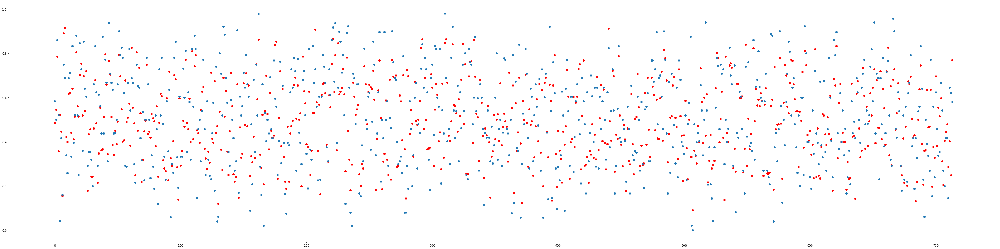

In [121]:
plt.figure(figsize=(60,15))
plt.scatter(range(len(np.concatenate(y_pred,axis=0))),np.concatenate(y_pred,axis=0),c='r')
plt.scatter(range(len(np.array(test_intensities))),np.array(test_intensities))

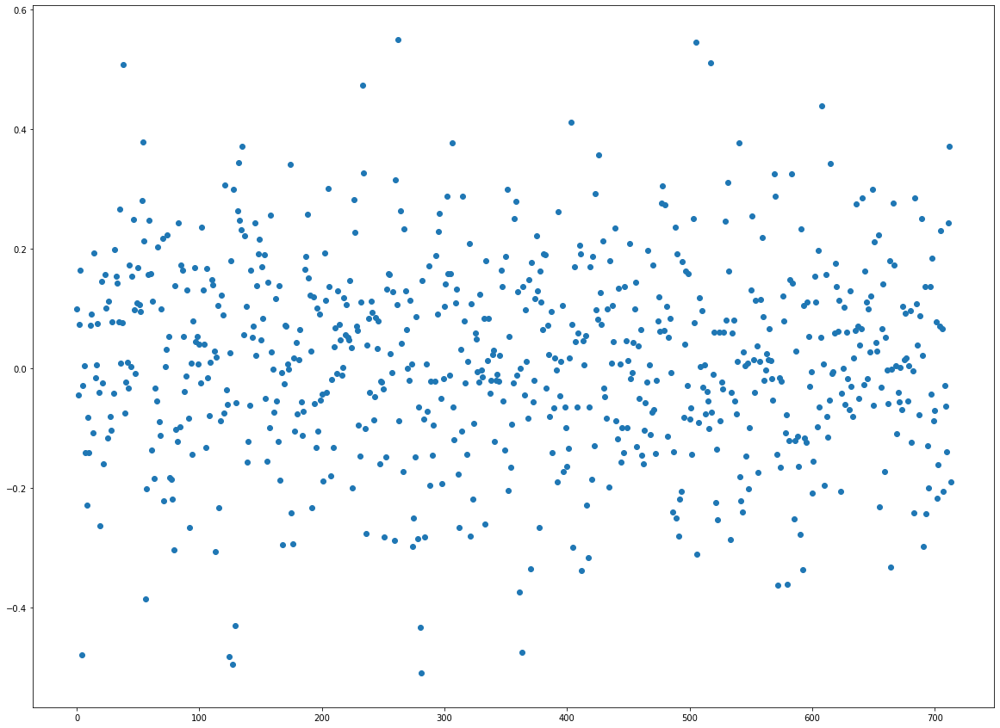

In [122]:
plt.figure(figsize=(20,15))
plt.scatter(range(len(np.array(test_intensities))),np.array(test_intensities)-np.concatenate(y_pred,axis=0))

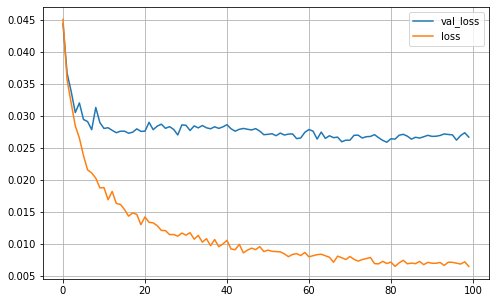

In [123]:
# show the learning curve
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)

In [124]:
neural_network_path = "files/final_models/" + "lstmatt_"+ emotion + ".h5"

neural_network_path

'files/final_models/lstmatt_joy.h5'

In [125]:
model.save(neural_network_path)

In [126]:
from keras.models import load_model
# Assuming your model includes instance of an "AttentionLayer" class
model1 = load_model(neural_network_path, custom_objects=SeqWeightedAttention.get_custom_objects())

# 4. Compare the Performance and Training Time Results

In [127]:
trainingtime

,Classifier,Training Time(Seconds)
0,LSTM-Attention,139.91


In [128]:
trainingtime.to_csv("training_time_lstmatt_"+emotion+".csv",mode='w')

In [129]:
all_score = pd.DataFrame(data = [score1], columns = ['pears-corr','spear-corr','pears-corr-range-05-1','spear-corr-range-05-1'],\
             index = ['LSTM-Attention'])
all_score

,pears-corr,spear-corr,pears-corr-range-05-1,spear-corr-range-05-1
LSTM-Attention,0.676758,0.675297,0.431586,0.440771


In [130]:
all_score.to_csv('score_lstmatt_'+emotion+'.csv',mode='w')

In [131]:
r2_square = pd.DataFrame(data = [score2], columns = ['R-squared score'],\
             index = ['LSTM-Attention'])
r2_square

,R-squared score
LSTM-Attention,0.433957


In [ ]:
r2_score.to_csv('r2_score_lstmatt_'+emotion+'.csv',mode='w')

# 5. Explore the Performance Using a Single Word Embeddings / Lexicon

In [132]:
def generate_WEM(unigram_feature_string):
    EMBEDDING_DIM = len(get_unigram_embedding("glad", embedding_info, unigram_feature_string))
    print(max_len, EMBEDDING_DIM)
    
    word_embedding_matrix = list()
    word_embedding_matrix.append(np.zeros(EMBEDDING_DIM))

    for word in sorted(word_indices, key=word_indices.get):
        if word in list(embedding_info.keys()):
            embedding_features = get_unigram_embedding(word, embedding_info, unigram_feature_string)    
            word_embedding_matrix.append(embedding_features)

    word_embedding_matrix = np.asarray(word_embedding_matrix, dtype='f')
    print(word_embedding_matrix.shape)
    
    new_word_indices = word_embedding_matrix.shape[0]
    
    from sklearn.preprocessing import scale
    word_embedding_matrix = scale(word_embedding_matrix)
    return EMBEDDING_DIM, word_embedding_matrix

In [133]:
def define_model(vocab_size, max_length,EMBEDDING_DIM,word_embedding_matrix):
    model = models.Sequential()
    #model.add( Embedding(new_word_indices, 32,  mask_zero=True))
    model.add(Embedding(vocab_size, EMBEDDING_DIM, weights=[word_embedding_matrix], 
                    input_length=max_len, trainable=False))
    model.add(Dropout(0.5))
    model.add(Bidirectional(LSTM(16, return_sequences=True)))
    
    model.add(Dropout(0.5))
    # add an attention layer

    # model.add(SeqSelfAttention(attention_activation='sigmoid'))
    model.add(SeqWeightedAttention())
    model.add(Dropout(0.5))
    
    model.add(Dense(1, activation='sigmoid') )

    model.compile(loss='mean_squared_error', optimizer="adam")
    return model

In [134]:
def model_explore(unigram_feature_string):
    EMBEDDING_DIM, WEM = generate_WEM(unigram_feature_string)
    model= define_model(new_word_indices, max_len, EMBEDDING_DIM, WEM)
    score_train = np.asarray(train_intensities)

    history = model.fit(train_encode, score_train, epochs=100, batch_size=32, verbose=1, validation_data=(test_encode,np.asarray(test_intensities))) 
 
    y_pred = model.predict(test_encode)
    
    score1 = evaluate_lists(np.concatenate(y_pred,axis=0),test_intensities)
    score2 = r2_score(np.array(test_intensities), np.concatenate(y_pred,axis=0))
    return score1, score2


In [135]:
unigram_feature_string_set = ["100000000000","010000000000","001000000000","000100000000","000010000000","000001000000",\
 "000000100000", "000000010000", "000000001000", "000000000100", "000000000010","000000000001","110000000000", "001111111111"]
for i in unigram_feature_string_set:
    print(get_features_from_identifier(i))

['Glove[Twitter]']
['Word2Vec[Twitter]']
['NRC-Emotion Intensity Lexicon']
['Wordnet-Affect']
['NRC-Emotion-Lexicon']
['NRC-Emoticon-Lexicon']
['NRC-Emoticon-AffLexNegLex']
['NRC-Hashtag-Emotion']
['NRC-Hashtag-Sentiment-Lexicon']
['NRC-Hashtag-Sentiment-AffLexNegLex']
['Emoji Intensity']
['Depeche Mood']
['Glove[Twitter]', 'Word2Vec[Twitter]']
['NRC-Emotion Intensity Lexicon', 'Wordnet-Affect', 'NRC-Emotion-Lexicon', 'NRC-Emoticon-Lexicon', 'NRC-Emoticon-AffLexNegLex', 'NRC-Hashtag-Emotion', 'NRC-Hashtag-Sentiment-Lexicon', 'NRC-Hashtag-Sentiment-AffLexNegLex', 'Emoji Intensity', 'Depeche Mood']


In [136]:
score1_1, score2_1 = model_explore(unigram_feature_string_set[0])
score1_2, score2_2 = model_explore(unigram_feature_string_set[1])
score1_3, score2_3 = model_explore(unigram_feature_string_set[2])
score1_4, score2_4 = model_explore(unigram_feature_string_set[3])
score1_5, score2_5 = model_explore(unigram_feature_string_set[4])
score1_6, score2_6 = model_explore(unigram_feature_string_set[5])
score1_7, score2_7 = model_explore(unigram_feature_string_set[6])
score1_8, score2_8 = model_explore(unigram_feature_string_set[7])
score1_9, score2_9 = model_explore(unigram_feature_string_set[8])
score1_10, score2_10 = model_explore(unigram_feature_string_set[9])
score1_11, score2_11 = model_explore(unigram_feature_string_set[10])
score1_12, score2_12 = model_explore(unigram_feature_string_set[11])

29 200
(4565, 200)


C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0435 - val_loss: 0.0431
Epoch 2/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0390 - val_loss: 0.0404
Epoch 3/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0369 - val_loss: 0.0382
Epoch 4/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0339 - val_loss: 0.0354
Epoch 5/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0325 - val_loss: 0.0330
Epoch 6/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0302 - val_loss: 0.0302
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0289 - val_loss: 0.0299
Epoch 8/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0260 - val_loss: 0.0294
Epoch 9/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0244 - val_loss: 0.0286
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0117 - val_loss: 0.0307
Epoch 82/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0104 - val_loss: 0.0311
Epoch 83/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0107 - val_loss: 0.0316
Epoch 84/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0107 - val_loss: 0.0298
Epoch 85/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0103 - val_loss: 0.0312
Epoch 86/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0105 - val_loss: 0.0315
Epoch 87/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0102 - val_loss: 0.0313
Epoch 88/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0105 - val_loss: 0.0316
Epoch 89/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0108 - val_loss: 0.0301
Epoch 90/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0105

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0453 - val_loss: 0.0527
Epoch 2/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0432 - val_loss: 0.0439
Epoch 3/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0390 - val_loss: 0.0418
Epoch 4/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0362 - val_loss: 0.0389
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0342 - val_loss: 0.0363
Epoch 6/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0304 - val_loss: 0.0349
Epoch 7/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0279 - val_loss: 0.0336
Epoch 8/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0260 - val_loss: 0.0333
Epoch 9/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0248 - val_loss: 0.0311
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0084 - val_loss: 0.0338
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0087 - val_loss: 0.0318
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0080 - val_loss: 0.0308
Epoch 84/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0076 - val_loss: 0.0325
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0083 - val_loss: 0.0323
Epoch 86/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0080 - val_loss: 0.0310
Epoch 87/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0084 - val_loss: 0.0314
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0075 - val_loss: 0.0326
Epoch 89/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0075 - val_loss: 0.0321
Epoch 90/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0078

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0460 - val_loss: 0.0489
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0441 - val_loss: 0.0464
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0421 - val_loss: 0.0448
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0406 - val_loss: 0.0440
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0405 - val_loss: 0.0431
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0407 - val_loss: 0.0427
Epoch 7/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0398 - val_loss: 0.0426
Epoch 8/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0388 - val_loss: 0.0424
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0378 - val_loss: 0.0420
Epoch 82/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0384 - val_loss: 0.0420
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0371 - val_loss: 0.0420
Epoch 84/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0374 - val_loss: 0.0420
Epoch 85/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0377 - val_loss: 0.0420
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0378 - val_loss: 0.0420
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0382 - val_loss: 0.0421
Epoch 88/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0372 - val_loss: 0.0420
Epoch 89/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0369 - val_loss: 0.0421
Epoch 90/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0374

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0475 - val_loss: 0.0496
Epoch 2/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0454 - val_loss: 0.0489
Epoch 3/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0452 - val_loss: 0.0478
Epoch 4/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0437 - val_loss: 0.0458
Epoch 5/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0427 - val_loss: 0.0454
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0420 - val_loss: 0.0455
Epoch 7/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0427 - val_loss: 0.0450
Epoch 8/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0415 - val_loss: 0.0449
Epoch 9/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0406 - val_loss: 0.0447
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0377 - val_loss: 0.0424
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0380 - val_loss: 0.0424
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0375 - val_loss: 0.0425
Epoch 84/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0384 - val_loss: 0.0427
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0374 - val_loss: 0.0426
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0383 - val_loss: 0.0426
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0369 - val_loss: 0.0423
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0368 - val_loss: 0.0427
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0371 - val_loss: 0.0427
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0368

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0485 - val_loss: 0.0466
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0446 - val_loss: 0.0451
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0438 - val_loss: 0.0442
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0431 - val_loss: 0.0437
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0430 - val_loss: 0.0433
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0407 - val_loss: 0.0433
Epoch 7/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0410 - val_loss: 0.0431
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0406 - val_loss: 0.0431
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0404 - val_loss: 0.0435
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0384 - val_loss: 0.0431
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0382 - val_loss: 0.0431
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0382 - val_loss: 0.0432
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0382 - val_loss: 0.0432
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0385 - val_loss: 0.0433
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0379 - val_loss: 0.0432
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0378 - val_loss: 0.0432
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0385 - val_loss: 0.0434
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0382 - val_loss: 0.0432
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0380

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0496 - val_loss: 0.0459
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0437 - val_loss: 0.0443
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0415 - val_loss: 0.0431
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0422 - val_loss: 0.0421
Epoch 5/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0393 - val_loss: 0.0412
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0386 - val_loss: 0.0405
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0364 - val_loss: 0.0400
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0386 - val_loss: 0.0397
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0366 - val_loss: 0.0395
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0318 - val_loss: 0.0365
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0305 - val_loss: 0.0365
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0305 - val_loss: 0.0364
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0303 - val_loss: 0.0367
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0305 - val_loss: 0.0366
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0300 - val_loss: 0.0365
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0298 - val_loss: 0.0369
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0311 - val_loss: 0.0366
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0310 - val_loss: 0.0368
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0309

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0541 - val_loss: 0.0517
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0444 - val_loss: 0.0488
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0430 - val_loss: 0.0451
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0402 - val_loss: 0.0427
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0380 - val_loss: 0.0417
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0368 - val_loss: 0.0401
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0371 - val_loss: 0.0392
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0361 - val_loss: 0.0396
Epoch 9/100
902/902 [==============================] - 3s 3ms/step - loss: 0.0352 - val_loss: 0.0389
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0304 - val_loss: 0.0357
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0299 - val_loss: 0.0361
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0304 - val_loss: 0.0357
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0302 - val_loss: 0.0363
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0298 - val_loss: 0.0361
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0295 - val_loss: 0.0368
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0298 - val_loss: 0.0365
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0302 - val_loss: 0.0360
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0299 - val_loss: 0.0358
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0304

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0525 - val_loss: 0.0455
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0427 - val_loss: 0.0445
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0413 - val_loss: 0.0438
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0397 - val_loss: 0.0433
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0398 - val_loss: 0.0430
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0386 - val_loss: 0.0430
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0391 - val_loss: 0.0431
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0388 - val_loss: 0.0428
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0380 - val_loss: 0.0428
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0366 - val_loss: 0.0418
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0373 - val_loss: 0.0418
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0374 - val_loss: 0.0417
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0379 - val_loss: 0.0417
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0374 - val_loss: 0.0418
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0375 - val_loss: 0.0417
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0373 - val_loss: 0.0418
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0370 - val_loss: 0.0418
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0375 - val_loss: 0.0419
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0377

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0484 - val_loss: 0.0479
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0436 - val_loss: 0.0463
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0436 - val_loss: 0.0437
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0418 - val_loss: 0.0425
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0406 - val_loss: 0.0416
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0404 - val_loss: 0.0406
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0377 - val_loss: 0.0399
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0374 - val_loss: 0.0394
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0380 - val_loss: 0.0390
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0336 - val_loss: 0.0371
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0329 - val_loss: 0.0371
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0321 - val_loss: 0.0370
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0341 - val_loss: 0.0369
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0329 - val_loss: 0.0371
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0331 - val_loss: 0.0371
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0328 - val_loss: 0.0371
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0327 - val_loss: 0.0370
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0330 - val_loss: 0.0369
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0329

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0427 - val_loss: 0.0468
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0415 - val_loss: 0.0463
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0410 - val_loss: 0.0456
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0403 - val_loss: 0.0447
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0403 - val_loss: 0.0447
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0397 - val_loss: 0.0441
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0389 - val_loss: 0.0436
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0390 - val_loss: 0.0435
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0394 - val_loss: 0.0436
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0375 - val_loss: 0.0417
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0381 - val_loss: 0.0421
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0381 - val_loss: 0.0423
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0376 - val_loss: 0.0418
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0380 - val_loss: 0.0419
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0368 - val_loss: 0.0414
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0375 - val_loss: 0.0415
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0374 - val_loss: 0.0419
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0385 - val_loss: 0.0419
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0371

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0529 - val_loss: 0.0480
Epoch 2/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0462 - val_loss: 0.0480
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0455 - val_loss: 0.0481
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0449 - val_loss: 0.0476
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0445 - val_loss: 0.0480
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0459 - val_loss: 0.0483
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0440 - val_loss: 0.0479
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0431 - val_loss: 0.0487
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0437 - val_loss: 0.0480
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0421 - val_loss: 0.0455
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0414 - val_loss: 0.0456
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0417 - val_loss: 0.0456
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0416 - val_loss: 0.0455
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0414 - val_loss: 0.0455
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0415 - val_loss: 0.0455
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0418 - val_loss: 0.0455
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0414 - val_loss: 0.0455
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0416 - val_loss: 0.0455
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0415

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0497 - val_loss: 0.0480
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0441 - val_loss: 0.0478
Epoch 3/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0404 - val_loss: 0.0465
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0406 - val_loss: 0.0462
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0399 - val_loss: 0.0435
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0388 - val_loss: 0.0447
Epoch 7/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0376 - val_loss: 0.0426
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0376 - val_loss: 0.0424
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0373 - val_loss: 0.0419
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0225 - val_loss: 0.0413
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0239 - val_loss: 0.0415
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0252 - val_loss: 0.0417
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0239 - val_loss: 0.0417
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0238 - val_loss: 0.0413
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0245 - val_loss: 0.0416
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0221 - val_loss: 0.0416
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0230 - val_loss: 0.0420
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0230 - val_loss: 0.0424
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0231

In [137]:
# all word embeddings
score1_13, score2_13 = model_explore(unigram_feature_string_set[12])

# all lexicons
score1_14, score2_14 = model_explore(unigram_feature_string_set[13])

29 600
(4565, 600)


C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0472 - val_loss: 0.0480
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0416 - val_loss: 0.0416
Epoch 3/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0362 - val_loss: 0.0390
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0329 - val_loss: 0.0354
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0293 - val_loss: 0.0319
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0280 - val_loss: 0.0314
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0231 - val_loss: 0.0287
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0235 - val_loss: 0.0285
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0210 - val_loss: 0.0280
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0071 - val_loss: 0.0300
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0068 - val_loss: 0.0293
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0070 - val_loss: 0.0280
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0074 - val_loss: 0.0295
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0068 - val_loss: 0.0297
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0069 - val_loss: 0.0299
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0070 - val_loss: 0.0307
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0071 - val_loss: 0.0305
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0067 - val_loss: 0.0301
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0058

C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\dell\Anaconda3\envs\tf2\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Train on 902 samples, validate on 714 samples
Epoch 1/100
902/902 [==============================] - 2s 2ms/step - loss: 0.0480 - val_loss: 0.0617
Epoch 2/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0442 - val_loss: 0.0446
Epoch 3/100
902/902 [==============================] - 1s 1ms/step - loss: 0.0390 - val_loss: 0.0405
Epoch 4/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0356 - val_loss: 0.0381
Epoch 5/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0348 - val_loss: 0.0359
Epoch 6/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0330 - val_loss: 0.0356
Epoch 7/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0327 - val_loss: 0.0350
Epoch 8/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0335 - val_loss: 0.0336
Epoch 9/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0315 - val_loss: 0.0333
Epoch 10/100
902/902 [=======================

Epoch 81/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0167 - val_loss: 0.0310
Epoch 82/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0169 - val_loss: 0.0303
Epoch 83/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0162 - val_loss: 0.0302
Epoch 84/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0169 - val_loss: 0.0303
Epoch 85/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0154 - val_loss: 0.0307
Epoch 86/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0165 - val_loss: 0.0306
Epoch 87/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0153 - val_loss: 0.0311
Epoch 88/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0159 - val_loss: 0.0309
Epoch 89/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0156 - val_loss: 0.0313
Epoch 90/100
902/902 [==============================] - 1s 2ms/step - loss: 0.0160

In [138]:
pd.DataFrame(data = [score1_1, score1_2, score1_3, score1_4, score1_5, score1_6, score1_7,\
                     score1_8, score1_9, score1_10, score1_11, score1_12, score1_13, score1_14, score1],\
             columns = ['pears-corr','spear-corr','pears-corr-range-05-1', 'spear-corr-range-05-1'],\
             index = ['Glove[Twitter]','Word2Vec[Twitter]','NRC-Emotion Intensity Lexicon','Wordnet-Affect','NRC-Emotion-Lexicon',\
                       'NRC-Emoticon-Lexicon', 'NRC-Emoticon-AffLexNegLex', 'NRC-Hashtag-Emotion', 'NRC-Hashtag-Sentiment-Lexicon',\
                       'NRC-Hashtag-Sentiment-AffLexNegLex', 'Emoji Intensity', 'Depeche Mood','All Word Embeddings',\
                      'All Lexicons','All Features'])

,pears-corr,spear-corr,pears-corr-range-05-1,spear-corr-range-05-1
Glove[Twitter],0.643718,0.642937,0.424687,0.429036
Word2Vec[Twitter],0.628177,0.624253,0.360474,0.363285
NRC-Emotion Intensity Lexicon,0.334810,0.350808,0.168830,0.184252
Wordnet-Affect,0.326972,0.325086,0.226384,0.223597
NRC-Emotion-Lexicon,0.305983,0.320610,0.157216,0.149688
NRC-Emoticon-Lexicon,0.475377,0.482485,0.260924,0.263269
NRC-Emoticon-AffLexNegLex,0.482036,0.489016,0.262012,0.265717
NRC-Hashtag-Emotion,0.334376,0.339751,0.105337,0.103463
NRC-Hashtag-Sentiment-Lexicon,0.461786,0.443792,0.179065,0.172656
NRC-Hashtag-Sentiment-AffLexNegLex,0.338974,0.329985,0.079095,0.092864


In [139]:
pd.DataFrame(data = [score2_1, score2_2, score2_3, score2_4, score2_5, score2_6, score2_7,\
                     score2_8, score2_9, score2_10, score2_11, score2_12, score2_13, score2_14, score2], columns = ['R-squared score'],\
             index = ['Glove[Twitter]','Word2Vec[Twitter]','NRC-Emotion Intensity Lexicon','Wordnet-Affect','NRC-Emotion-Lexicon',\
                       'NRC-Emoticon-Lexicon', 'NRC-Emoticon-AffLexNegLex', 'NRC-Hashtag-Emotion', 'NRC-Hashtag-Sentiment-Lexicon',\
                       'NRC-Hashtag-Sentiment-AffLexNegLex', 'Emoji Intensity', 'Depeche Mood','All Word Embeddings',\
                      'All Lexicons','All Features'])

,R-squared score
Glove[Twitter],0.347453
Word2Vec[Twitter],0.319213
NRC-Emotion Intensity Lexicon,0.109814
Wordnet-Affect,0.096272
NRC-Emotion-Lexicon,0.077951
NRC-Emoticon-Lexicon,0.216422
NRC-Emoticon-AffLexNegLex,0.228259
NRC-Hashtag-Emotion,0.108625
NRC-Hashtag-Sentiment-Lexicon,0.209838
NRC-Hashtag-Sentiment-AffLexNegLex,0.114492
